In [1]:
import ccxt
import numpy as np
import pandas as pd
import datetime as dt
from dateutil import tz
import matplotlib.pyplot as plt

import json
import time
import os
import sys

In [2]:
src_path = '../src/'
sys.path.append(os.path.abspath(src_path))
import func_get
import func_signal
import func_backtest

In [3]:
start_ts = time.time()

In [4]:
interval_dict = {
    '1m': 1,
    '5m': 5,
    '15m': 15,
    '30m': 30,
    '1h': 60,
    '2h': 120,
    '4h': 240,
    '1d': 1440
}

In [5]:
with open('../../../_keys/ftx/ftx_read_keys.json') as keys_file:
    keys_dict = json.load(keys_file)
    
exchange = ccxt.ftx({'apiKey': keys_dict['apiKey'],
                     'secret': keys_dict['secret'],
                     'enableRateLimit': True})

### Config

In [6]:
project_name = 'cryptoris_15m'

In [7]:
start_date = dt.datetime(2022, 1, 1)
start_hour = 0
end_date = dt.datetime.today() - dt.timedelta(days=1)
reinvest_profit_flag = True

In [8]:
config_params = {
    'safety_ohlcv_range': 1000,
    'action_timeframe': '15m',
    'target_side': ['buy', 'sell'],
    'base': {
        'symbol': ['ETH-PERP', 'SOL-PERP', 'LUNA-PERP'],
        'open': {
            '15m': {
                'ema': {
                    'check': ['check_signal_side'],
                    'look_back': 1,
                    'windows': 200,
                    'revert': False
                },
                'supertrend': {
                    'check': ['check_signal_side_change'],
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': ['check_signal_band'],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }
            },
            '1h': {
                'ema': {
                    'check': ['check_signal_side'],
                    'look_back': 1,
                    'windows': 200,
                    'revert': False
                },
                'supertrend': {
                    'check': ['check_signal_side'],
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': ['check_signal_band'],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }
            }    
            
        },
        'close': {
            '15m': {
                'supertrend': {
                    'check': ['check_signal_side'],
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': ['check_signal_band'],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }    
            }
        }
    },
    'lead': {
        'symbol': ['BTC-PERP'],
        'open': {
            '15m': {
                'wt': {
                    'check': ['check_signal_band'],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }
            }
        },
        'close': {
        }
    },
    'tp': {
        'stop_percent': 50,
        'price_percent': 5,
        'signal': None,
    },
    'sl': {
        'stop_percent': 50,
        'price_percent': None,
        'signal': {
            'timeframe': '15m',
            'signal': {
                'supertrend': {
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                }
            }
        }
    },
    'action_percent': 10,
    'leverage': 5,
    'taker_fee_percent': 0.07
}

### Get data

In [9]:
ohlcv_df_dict = func_get.get_data(exchange, start_date, end_date, start_hour, interval_dict, config_params)

base: timeframe 1/2 symbol 1/3 date 1/149
base: timeframe 1/2 symbol 1/3 date 2/149
base: timeframe 1/2 symbol 1/3 date 3/149
base: timeframe 1/2 symbol 1/3 date 4/149
base: timeframe 1/2 symbol 1/3 date 5/149
base: timeframe 1/2 symbol 1/3 date 6/149
base: timeframe 1/2 symbol 1/3 date 7/149
base: timeframe 1/2 symbol 1/3 date 8/149
base: timeframe 1/2 symbol 1/3 date 9/149
base: timeframe 1/2 symbol 1/3 date 10/149
base: timeframe 1/2 symbol 1/3 date 11/149
base: timeframe 1/2 symbol 1/3 date 12/149
base: timeframe 1/2 symbol 1/3 date 13/149
base: timeframe 1/2 symbol 1/3 date 14/149
base: timeframe 1/2 symbol 1/3 date 15/149
base: timeframe 1/2 symbol 1/3 date 16/149
base: timeframe 1/2 symbol 1/3 date 17/149
base: timeframe 1/2 symbol 1/3 date 18/149
base: timeframe 1/2 symbol 1/3 date 19/149
base: timeframe 1/2 symbol 1/3 date 20/149
base: timeframe 1/2 symbol 1/3 date 21/149
base: timeframe 1/2 symbol 1/3 date 22/149
base: timeframe 1/2 symbol 1/3 date 23/149
base: timeframe 1/2 

base: timeframe 1/2 symbol 2/3 date 42/149
base: timeframe 1/2 symbol 2/3 date 43/149
base: timeframe 1/2 symbol 2/3 date 44/149
base: timeframe 1/2 symbol 2/3 date 45/149
base: timeframe 1/2 symbol 2/3 date 46/149
base: timeframe 1/2 symbol 2/3 date 47/149
base: timeframe 1/2 symbol 2/3 date 48/149
base: timeframe 1/2 symbol 2/3 date 49/149
base: timeframe 1/2 symbol 2/3 date 50/149
base: timeframe 1/2 symbol 2/3 date 51/149
base: timeframe 1/2 symbol 2/3 date 52/149
base: timeframe 1/2 symbol 2/3 date 53/149
base: timeframe 1/2 symbol 2/3 date 54/149
base: timeframe 1/2 symbol 2/3 date 55/149
base: timeframe 1/2 symbol 2/3 date 56/149
base: timeframe 1/2 symbol 2/3 date 57/149
base: timeframe 1/2 symbol 2/3 date 58/149
base: timeframe 1/2 symbol 2/3 date 59/149
base: timeframe 1/2 symbol 2/3 date 60/149
base: timeframe 1/2 symbol 2/3 date 61/149
base: timeframe 1/2 symbol 2/3 date 62/149
base: timeframe 1/2 symbol 2/3 date 63/149
base: timeframe 1/2 symbol 2/3 date 64/149
base: timef

base: timeframe 1/2 symbol 3/3 date 84/149
base: timeframe 1/2 symbol 3/3 date 85/149
base: timeframe 1/2 symbol 3/3 date 86/149
base: timeframe 1/2 symbol 3/3 date 87/149
base: timeframe 1/2 symbol 3/3 date 88/149
base: timeframe 1/2 symbol 3/3 date 89/149
base: timeframe 1/2 symbol 3/3 date 90/149
base: timeframe 1/2 symbol 3/3 date 91/149
base: timeframe 1/2 symbol 3/3 date 92/149
base: timeframe 1/2 symbol 3/3 date 93/149
base: timeframe 1/2 symbol 3/3 date 94/149
base: timeframe 1/2 symbol 3/3 date 95/149
base: timeframe 1/2 symbol 3/3 date 96/149
base: timeframe 1/2 symbol 3/3 date 97/149
base: timeframe 1/2 symbol 3/3 date 98/149
base: timeframe 1/2 symbol 3/3 date 99/149
base: timeframe 1/2 symbol 3/3 date 100/149
base: timeframe 1/2 symbol 3/3 date 101/149
base: timeframe 1/2 symbol 3/3 date 102/149
base: timeframe 1/2 symbol 3/3 date 103/149
base: timeframe 1/2 symbol 3/3 date 104/149
base: timeframe 1/2 symbol 3/3 date 105/149
base: timeframe 1/2 symbol 3/3 date 106/149
base

base: timeframe 2/2 symbol 2/3 date 7/118
base: timeframe 2/2 symbol 2/3 date 8/118
base: timeframe 2/2 symbol 2/3 date 9/118
base: timeframe 2/2 symbol 2/3 date 10/118
base: timeframe 2/2 symbol 2/3 date 11/118
base: timeframe 2/2 symbol 2/3 date 12/118
base: timeframe 2/2 symbol 2/3 date 13/118
base: timeframe 2/2 symbol 2/3 date 14/118
base: timeframe 2/2 symbol 2/3 date 15/118
base: timeframe 2/2 symbol 2/3 date 16/118
base: timeframe 2/2 symbol 2/3 date 17/118
base: timeframe 2/2 symbol 2/3 date 18/118
base: timeframe 2/2 symbol 2/3 date 19/118
base: timeframe 2/2 symbol 2/3 date 20/118
base: timeframe 2/2 symbol 2/3 date 21/118
base: timeframe 2/2 symbol 2/3 date 22/118
base: timeframe 2/2 symbol 2/3 date 23/118
base: timeframe 2/2 symbol 2/3 date 24/118
base: timeframe 2/2 symbol 2/3 date 25/118
base: timeframe 2/2 symbol 2/3 date 26/118
base: timeframe 2/2 symbol 2/3 date 27/118
base: timeframe 2/2 symbol 2/3 date 28/118
base: timeframe 2/2 symbol 2/3 date 29/118
base: timefram

base: timeframe 2/2 symbol 3/3 date 80/118
base: timeframe 2/2 symbol 3/3 date 81/118
base: timeframe 2/2 symbol 3/3 date 82/118
base: timeframe 2/2 symbol 3/3 date 83/118
base: timeframe 2/2 symbol 3/3 date 84/118
base: timeframe 2/2 symbol 3/3 date 85/118
base: timeframe 2/2 symbol 3/3 date 86/118
base: timeframe 2/2 symbol 3/3 date 87/118
base: timeframe 2/2 symbol 3/3 date 88/118
base: timeframe 2/2 symbol 3/3 date 89/118
base: timeframe 2/2 symbol 3/3 date 90/118
base: timeframe 2/2 symbol 3/3 date 91/118
base: timeframe 2/2 symbol 3/3 date 92/118
base: timeframe 2/2 symbol 3/3 date 93/118
base: timeframe 2/2 symbol 3/3 date 94/118
base: timeframe 2/2 symbol 3/3 date 95/118
base: timeframe 2/2 symbol 3/3 date 96/118
base: timeframe 2/2 symbol 3/3 date 97/118
base: timeframe 2/2 symbol 3/3 date 98/118
base: timeframe 2/2 symbol 3/3 date 99/118
base: timeframe 2/2 symbol 3/3 date 100/118
base: timeframe 2/2 symbol 3/3 date 101/118
base: timeframe 2/2 symbol 3/3 date 102/118
base: ti

### Add signal

In [10]:
ohlcv_df_dict = func_signal.add_signal(start_date, ohlcv_df_dict, interval_dict, config_params)

base add ema to ETH-PERP 1h
base add supertrend to ETH-PERP 1h
base add wt to ETH-PERP 1h
base add ema to SOL-PERP 1h
base add supertrend to SOL-PERP 1h
base add wt to SOL-PERP 1h
base add ema to LUNA-PERP 1h
base add supertrend to LUNA-PERP 1h
base add wt to LUNA-PERP 1h
base add ema to ETH-PERP 15m
base add supertrend to ETH-PERP 15m
base add wt to ETH-PERP 15m
base add ema to SOL-PERP 15m
base add supertrend to SOL-PERP 15m
base add wt to SOL-PERP 15m
base add ema to LUNA-PERP 15m
base add supertrend to LUNA-PERP 15m
base add wt to LUNA-PERP 15m
lead add wt to BTC-PERP 15m


### Back test

In [11]:
action_time_list = func_get.gen_action_time_list(config_params, ohlcv_df_dict)
max_open_timeframe = func_backtest.get_max_open_timeframe(config_params, interval_dict)

In [12]:
budget = 100

transaction_dict = {
    'symbol': [],
    'side': [],
    'amount': [],
    'open_time': [],
    'open_price': [],
    'close_time': [],
    'close_price': [],
    'value': [],
    'notional': [],
    'profit': [],
    'profit_percent': []
}

position_dict = {}

if reinvest_profit_flag == True:
    budget_dict = {
        'time': [],
        'budget': []
    }
    
max_drawdown = 0

In [13]:
if reinvest_profit_flag == True:
    min_budget = budget

time_count = 0

for signal_time in action_time_list:
    action_time = signal_time + dt.timedelta(minutes=interval_dict[config_params['action_timeframe']])
    
    time_count += 1
    print(f"Time {action_time}: progress {time_count}/{len(action_time_list)}")

    '''
    Close positions
    '''
    for symbol in [x for x in position_dict.keys()]:
        print(f"  {symbol}")
        budget, max_drawdown, position_dict, transaction_dict = func_backtest.close_position(symbol, signal_time, max_drawdown, config_params, budget, reinvest_profit_flag, ohlcv_df_dict, position_dict, transaction_dict, interval_dict)

    '''
    Open positions
    '''
    max_position = int(1 / (config_params['action_percent'] / 100))

    for symbol in [x for x in config_params['base']['symbol'] if x not in position_dict.keys()][:max_position]:
        print(f"  {symbol}")
        position_dict = func_backtest.open_position(symbol, signal_time, max_open_timeframe, config_params, budget, ohlcv_df_dict, position_dict, interval_dict)    
    
    '''
    Update budget
    '''
    if reinvest_profit_flag == True:
        budget_dict['time'].append(signal_time)
        budget_dict['budget'].append(budget)

        if budget < min_budget:
            min_budget = budget

    if budget <= 0:
        print(f"Out of money at {action_time}")
        break
        
'''
Clear final position
'''
opened_symbol = list(position_dict.keys())

for symbol in opened_symbol:
    print(f" Clear {symbol} position")
    
    side = position_dict[symbol]['side']
    ohlcv_df = ohlcv_df_dict['base'][config_params['action_timeframe']][symbol]
    current_ohlcv_df = ohlcv_df[ohlcv_df['time'] == signal_time].reset_index(drop=True)
    close_price = current_ohlcv_df.loc[0, 'close']
    close_percent = 100
    
    budget, position_dict, transaction_dict = func_backtest.update_close_position(symbol, side, close_price, close_percent, signal_time, config_params, budget, reinvest_profit_flag, position_dict, transaction_dict, interval_dict)

Time 2022-01-01 00:15:00: progress 1/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUN

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-01 06:30:00: progress 26/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     b

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-01 12:00:00: progress 48/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base 

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.013544262650341315
     price: 3691.6
     tp: 3507.0199999999995
     sl: 3749.4692062444415
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side 

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-01 23:30

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     bas

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-02 11:15:00: progress 141/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base E

     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-02 18:45:00: progress 171/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     ba

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-03 01:45:00: progress 199/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band w

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-03

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-03 12:00:00: progress 240/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP ch

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-03 17:15:00: progress 261/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 173.91822773518146
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-03 23:30:00

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
    

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP chec

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-04 18:15:00: progress 361/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_ba

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-05 00:00:00: progress 384/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base E

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-05 06:00:00: progress 408/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-05 12:00:00: progress 432/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-P

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-05 17:30:00: progress 454/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-06 00:30:00: progress 482/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action


     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-06 06:15:00: progress 505/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_b

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-06 12:15:00: progress 529/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-P

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-06 19:15:00: progress 557/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP ch

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-07 07:00:00: progress 604/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     ba

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-07 13:30:00: progress 630/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base 

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-07 19:45:00: progress 655/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP ch

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-08 02:00:00: progress 680/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sel

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP ch

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-08 15:45:00: progress 735/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base 

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-08 21:30:00: progress 758/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.016153732767779372
     price: 3191.1
     tp: 3031.5449999999996
     sl: 3233.922124500862
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead B

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 03:45:00: progress 783/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signa

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 10:15:00: progress 809/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-P

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 16:00:00: progress 832/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signa

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 22:30:00: progress 858/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signa

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-10 05:00:00: progress 884/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_sid

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-10 10:30:00: progress 906/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-10 17:00:00: progress 932/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 202

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-11 04:30:00: progress 978/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-11 10:30:00: progress 1002/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SO

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     bas

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-11 23:30:00: progress 1054/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_si

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-12 11:00:00: progress 1100/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_b

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-12 16:00:00: progress 1120/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base 

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-13 03:30:00: progress 1166/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PE

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-13 15:15:00: progress 1213/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 149.47640472740977
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_sig

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-13 21:30:00: progress 1238/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.015314182512209272
     price: 3384.9
     tp: 3554.1450000000004
     sl: 3340.289709730

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 03:00:00: progress 1260/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base L

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 09:15:00: progress 1285/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signa

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 14:45:00: progress 1307/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base 

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 20

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-15 03:15:00: progress 1357/10272
  ETH-PERP
     base ETH-P

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-15 09:45:00: progress 1383/10272
  SOL-PERP
     ba

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-15 16:00:00: progress 1408/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     ba

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-15 23:15:00: progress 1437/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 3314.5260039001396
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_s

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-16 05:45:00: progress 1463/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PE

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-16 12:00:00: progress 1488/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_s

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-16 18:15:00: progress 1513/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP ch

     base SOL-PERP check_signal_band wt 15m: sell
     Closed by signal at 148.0225
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-17 03:15:00: progress 1549/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertre

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-17 10:00:00: progress 1576/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     bas

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-17 16:15:00: progress 1601/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signa

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-17 21:15:00: progress 1621/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base 

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-18 08:30:00: progress 1666/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base 

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-18 16:00:00: progress 1696/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side super

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-18 22:30:00: progress 1722/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ba

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-19 04:45:00: progress 1747/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-19 09:45:00: progress 1767/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-19 16:15:00: progress 1793/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-19 21:30:00: progress 1814/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base S

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-20 03:00:00: progress 1836/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_ban

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-20 09:00:00: progress 1860/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 137.55953442544094
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m:

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-20 14:15:00: progress 1881/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-20 18:45:00: progress 1899/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ban

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP che

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-21 04:15:00: progress 1937/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-21 08:15:00: progress 1953/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     bas

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-21 11:45:00: progress 1967/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     ba

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
    

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-21 20:15:00: progress 2001/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-22 00:30:00: progress 2018/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base 

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-22 05:00:00: progress 2036/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_s

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-22 11:00:00: progress 2060/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-P

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-22 15:30:00: progress 2078/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base 

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     bas

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-23 01:15:00: progress 2117/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUN

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-23 06:00:00: progress 2136/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base 

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-23 10:15:00: progress 2153/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUN

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-23 20:45:00: progress 2195/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     bas

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-24 08:15:00: progress 2241/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 99.06018856784107
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP che

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-24 20:45:00: progress 2291/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-P

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-25 02:15:00: progress 2313/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signa

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_sign

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-25 13:30:00: progress 2358/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_sid

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-25 19:00:00: progress 2380/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 00:15:00: progress 2401/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 05:30:00: progress 2422/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-P

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 11:30:00: progress 2446/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 16:45:00: progress 2467/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PE

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP c

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-27 04:15:00: progress 2513/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SO

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
    

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-P

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-27 19:45:00: progress 2575/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     b

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.5898609982863976
     price: 90.19
     tp: 85.6805
     sl: 94.20377678720327
Time 2022-01-28 00:45:00: progress 2595/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 60.472468368116246
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 93.54227410848293
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-28

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-28 07:15:00: progress 2621/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base S

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-28 12:15:00: progress 2641/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     

     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 91.98748434560893
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-28 18:15:00: progress 2665/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: 

     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-28 23:45:00: progress 2687/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-29 05:15:00: progress 2709/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-29 15:15:00: progress 2749/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base 

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-30 02:15:00: progress 2793/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base 

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-30 08:00:00: progress 2816/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-30 13:45:00: progress 2839/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PER

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-30 18:15:00: progress 2857/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PER

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-30 23:45:00: progress 2879/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-31 04:30:00: progress 2898/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_sign

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-31 10:15:00: progress 2921/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base 

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-31 15:15:00: progress 2941/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_sig

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-31 19:45:00: progress 2959/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_sign

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-01 01:00:00: progress 2980/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SO

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 11:45:00: progress 3023/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_si

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 16:45:00: progress 3043/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP chec

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 22:30:00: progress 3066/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-02 03:30:00: progress 3086/10272
  ETH-PERP
     base ETH-P

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-02 09:00:00: progress 3108/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-P

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-02 14

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_s

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 01:00:00: progress 3172/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base 

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 07:00:00: progress 3196/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: buy
     Closed by signal at 47.579
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No actio

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 11:30:00: progress 3214/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SO

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 17:00:00: progress 3236/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
    

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 22:30:00: progress 3258/10272
  ETH-PERP
     bas

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-04 04:00:00: progress 3280/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base L

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-0

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-04 14:15:00: progress 3321/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PER

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal

     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 2870.8083549239905
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-05 01:30:00: progress 3366/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     

     base ETH-PERP check_signal_band wt 15m: sell
     Closed by signal at 2984.9
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change 

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base L

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUN

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-05 23:15:00: progress 3453/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 04:15:00: progress 3473/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 09:

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 14:15:00: progress 3513/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side sup

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 19:30:00: progress 3534/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-07 01:00:00: progress 3556/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_b

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-07 06:00:00: progress 3576/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band 

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-07 11:00:00: progress 3596/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: sell
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: s

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-07 21:00:00: progress 3636/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-08 02:00:00: progress 3656/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ET

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-08 07:00:00: progress 3676/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_ba

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-08 12:

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-08 17:00:00: progress 3716/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ET

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-08 21:45:00: progress 3735/10272
  ETH-PERP
     bas

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     ba

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 07:00:00: progress 3772/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 11:15:00: progress 3789/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 15:15:00: progress 3805/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     b

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 19:30:00: progress 3822/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base S

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 23:45:00: progress 3839/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PER

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-10 04:15:00: progress 3857/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP che

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP che

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-10 17:45:00: progress 3911/10272
  ETH-PERP
     base ETH

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-10 22:45:00: progress 3931/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Closed by signal at 113.2325
  ETH-PERP
     base ETH-PERP check_signal_s

     Update sl: 55.480532437243404
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 03:30:00: progress 3950/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_s

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 13:00:00: progress 3988/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LU

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 18:15:00: progress 4009/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SO

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PE

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-12 04:45:00: progress 4051/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_sign

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-12 09:30:00: progress 4070/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     ba

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-12 13:45:00: progress 4087/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LU

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP ch

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-12 22:30:00: progress 4122/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     b

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
    

     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-13 09:30:00: progress 4166/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUN

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-13 16:00:00: progress 4192/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-13 22:15:00: progress 4217/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
 

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 03:30:00: progress 4238/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base S

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     b

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 16:45:00: progress 4291/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 21:45:00: progress 4311/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-

     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 2937.4008229989354
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-15 02:45:00: progress 4331/10272
  ETH-PERP
     base ETH-PERP check_signal_side

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-15 08:00:00: progress 4352/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lea

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-15 13:00:00: progress 4372/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PE

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-15 17:45:00: progress 4391/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-16 03:15:00: progress 4429/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP c

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-16 08:15:00: progress 4449/10272
  SOL-PERP
     Stop loss at 102.73290175253639
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_chan

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-16 1

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-16 22:30:00: progress 4506/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-17 06:00:00: progress 4536/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
   

     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.5548972454679761
     price: 100.755
     tp: 95.71724999999999
     sl: 102.89823264155181
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-17 10:30:00: progress 4554/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 102.24903437739664
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP ch

     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.017834987460952568
     price: 3129.1
     tp: 3285.555
     sl: 3073.0119983668624
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: n

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-17 20:15:00: progress 4593/10272
  SOL-PERP
   

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-18 00:15:00: progress 4609/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-18 09:00:00: progress 4644/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-18 12:45:00: progress 4659/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base 

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
    

  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 95.79500921172482
Time 2022-02-18 20:45:00: progress 4691/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 95.69600829055236
Time 2022-02-18 21:00:00: progress 4692/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PER

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 01:00:00: progress 4708/10272
  ETH-PERP
     base 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 04:30:00: progress 4722/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUN

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 08:45:00: progress 4739/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     b

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 12:45:00: progress 4755/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     ba

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-19 17:45:00: progress 4775/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 91.93360396599651
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-19 21:45:00: progress 4791/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PE

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-20 01:30:00: progress 4806/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-20 04:45:00: progress 4819/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base S

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-20 08:15:00: progress 4833/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 2761.2534606675467
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.6373424012519847
     price: 89.86
     tp: 85.36699999999999
     sl: 91.40836282532293
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-20 13:45:00: progress 4855/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signa

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-20 18:30:00: progress 4874/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_s

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     b

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-21 02:15:00: progress 4905/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-21 06:00:00: progress 4920/10272
  ETH-PERP
     Stop loss at 2634.055152981368
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP c

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-21 09:45:00: progress 4935/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_b

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-21 13:30:00: progress 4950/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PE

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-21 18:15:00: progress 4969/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PER

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-21 22:30:00: progress 4986/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_sign

     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-22 03:15:00: progress 5005/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PE

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-22 13:15:00: progress 5045/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     bas

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-22 22:15:00: progress 5081/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_s

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-23 03:00:00: progress 5100/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 1.0724465211332355
     price

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-23 11:30:00: progress 5134/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 54.396116144314064
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_cha

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-23 20:45:00: progress 5171/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signa

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-24 06:00:00: progress 5208/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-24 10:45:00: progress 5227/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-24 15:30:00: progress 5246/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-25 00:45:00: progress 5283/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     bas

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-25 05:30:00: progress 5302/10272
  ETH-PERP
     base ETH-

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-25 09:45:00: progress 5319/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PER

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-25 14

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-25 18:30:00: progress 5354/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-P

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-25 23:45:00: progress 5375/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-26 09:15:00: progress 5413/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ET

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-26 13:45:00: progress 5431/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_ba

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-26 18:15:00: progress 5449/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP 

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-26 22:30:00: progress 5466/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band

     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 2776.3665285089846
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-27 03:00:00: progr

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_ban

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-27 12:30:00: progress 5522/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_sig

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-27 17:00:00: progress 5540/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_s

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-27 21:30:00: progress 5558/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SO

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-28 02:15:00: progress 5577/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-28 06:45:00: progress 5595/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-28 11:30:00: progress 5614/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-28 16:00:00: progress 5632/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_si

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-28 20:30:00: progress 5650/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-01 01:15:00: progress 5669/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ba

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-01 05:45:00: progress 5687/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PER

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-01 10:30:00: progress 5706/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_sid

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-01 15:00:00: progress 5724/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-01 19:30:00: progress 5742/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.020783890603275432
     price: 2945.4
     tp: 3092.67
     sl: 2863.225865807124
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.6173544915579615
     price: 99

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ba

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-02 05:30:00: progress 5782/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-02 10:45:00: progress 5803/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 89.9228634103205
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: sell
     Closed by signal at 104.585
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-02 16:00:00: progress 5824/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     ba

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-03 02:45:00: progress 5867/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base

     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 2920.091479423142
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-03 08:15:00: progress 5889/10272
  ETH-PERP
     base ETH-PERP check_signal_

     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-03 13:45:00: progress 5911/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base L

     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 91.51641935995403
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 2879.266762086166
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
Time 2022-03-03 19:00:00: progress 5932/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
Time 2022-03-03 19:15:00: progress 5933/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 1

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 00:45:00: progress 5955/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 05:15:00: progress 5973/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_sign

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 09:45:00: progress 5991/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP ch

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 14:15:00: progress 6009/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 18:45:00: progress 6027/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-04 23:15:00: progress 6045/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-05 03:30:00: progress 6062/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-05 08:00:00: progress 6080/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-05 12:30:00: progress 6098/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     bas

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-05 16:45:00: progress 6115/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side super

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-06 01:30:00: progress 6150/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base E

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-06 05:45:00: progress 6167/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     bas

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-06 14:30:00: progress 6202/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-P

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-06 19:00:00: progress 6220/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-06 23:30:00: progress 6238/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-07 04:00:00: progress 6256/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-07 08:45:00: progress 6275/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
 

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-07 14:00:00: progress 6296/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-07 19:00:00: progress 6316/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-07 23:30:00: progress 6334/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base S

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-P

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 08:45:00: progress 6371/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
    

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 17:30:00: progress 6406/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SO

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 21:30:00: progress 6422/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base 

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 06:15:00: progress 6457/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_ba

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 09:45:00: progress 6471/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 13:15:00: progress 6485/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PE

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 16:45:00: progress 6499/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 21:00:00: progress 6516/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SO

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-10 01:30:00: progress 6534/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-10 05:45:00: progress 6551/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_ban

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-10 10:00:00: progress 6568/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ban

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP 

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-10 18:45:00: progress 6603/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signa

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-11 03:30:00: progress 6638/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-P

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     b

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 83.07267006357556
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-11 11:45:00

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-11 16:15:00: progress 6689/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
   

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-11 21:15:00: progress 6709/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     le

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-12 02:00:00: progress 6728/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 82.33902080580708
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP ch

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-12 07:00:00: progress 6748/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-12 16:00:00: progress 6784/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: se

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-12 21:00:00: progress 6804/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sel

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-13 01:30:00: progress 6822/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_sign

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP ch

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-13 10:30:00: progress 6858/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy


     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP che

     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 81.87086113407489
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-13 19:00:00: progress 6892/10272
  SOL-PERP
     base SOL-PERP chec

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-13 23:15:00: progress 6909/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-P

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-14 03:00:00: progress 6924/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-14 07:00:00: progress 6940/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base S

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-14 10:30:00: progress 6954/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-14 14:15:00: progress 6969/10272
  ETH-PERP
     bas

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUN

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-14 21:00:00: progress 6996/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PER

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 00:30:00: progress 7010/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 04:00:00: progress 7024/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 07:45:00: progress 7039/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 12:00:00: progress 7056/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP 

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 16:15:00: progress 7073/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_b

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-1

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 23:45:00: progress 7103/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PER

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-16 03:00:00: progress 7116/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PE

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-16 07:00:00: progress 7132/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_s

     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-16 11:15:00: progress 7149/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side s

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-1

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-16 20:15:00: progress 7185/10272
  SOL-PERP
     Stop loss at 82.9145188816415
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 00:15:00: progress 7201/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
  

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 04:15:00: progress 7217/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 84.29354728093794
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP 

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base 

  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 12:00:00: progress 7248/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-P

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-17 16:00:00: progress 7264/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 19:45:00: progress 7279/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     b

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 23:15:00: progress 7293/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 89.3746069039908
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell


     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-18 03:15:00: progress 7309/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     ba

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-18 07:15:00: progress 7325/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PE

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-18 10:30:00: progress 7338/10272
  ETH-PERP
     base E

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-18 14:00:00: progress 7352/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell


     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-18 18:45:00: progress 7371/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
   

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-18 23:15:00: progress 7389/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band 

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-19 03:30:00: progress 7406/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 07:30:00: progress 7422/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PE

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 11:45:00: progress 7439/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 16:00:00: progress 7456/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 20:15:00: progress 7473/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: sell
     Closed by signal at 2969.0
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_ac

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-20 00:30:00: progress 7490/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side s

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-20 04:45:00: progress 7507/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-20 09:30:00: progress 7526/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-20 14:00:00: progress 7544/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-20 14:15:00: progress 7545/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_sign

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-20 18:45:00: progress 7563/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-20 22:45:00: progress 7579/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band 

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 02:30:00: progress 7594/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP c

     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 10:00:00: progress 7624/10272
  LUNA-PERP
     base LUNA-PE

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 14:00:00: progress 7640/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PER

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 18:15:00: progress 7657/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP 

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP chec

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 06:00:00: progress 7704/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PER

     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 2910.371944274086
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 10:00:00: progress 7720/10272
  ETH-PERP
     base ETH-PERP check_sign

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 14:00:00: progress 7736/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 17:45:00: progress 7751/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 22:15:00: progress 7769/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 02:30:00: progress 7786/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SO

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 06:45:00: progress 7803/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PER

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 11:00:00: progress 7820/10272
  ETH-PERP
     base ETH

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 15:15:00: progress 7837/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base SOL-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 90.86285695587966
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 20:15:00: progress 7857/10272
  SOL-PERP
     base SOL-PERP check_signal_side supe

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-24 00:30:00: progress 7874/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-24 04:30:00: progress 7890/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side sup

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-24 08:45:00: progress 7907/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_sid

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-24 13:00:00: progress 7924/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-24 17:15:00: progress 7941/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base S

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-24 21:45:00: progress 7959/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 02:30:00: progress 7978/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 3070.9789218318792
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_c

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 07:30:00: progress 7998/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
   

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 12:00:00: progress 8016/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signa

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 00:30:00: progress 8066/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 04:45:00: progress 8083/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     b

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 09:00:00: progress 8100/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     bas

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 13:15:00: progress 8117/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     ba

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-26 21:30:00: progress 8150/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-27 01:30:00: progress 8166/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base S

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-27 05:45:00: progress 8183/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base E

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-27 09:45:00: progress 8199/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_s

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-27 14:15:00: progress 8217/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     bas

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-27 19:00:00: progress 8236/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     le

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-27 23:15:00: progress 8253/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_sig

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 03:00:00: progress 8268/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PE

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LU

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 10:45:00: progress 8299/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-28 18:30:00: progress 8330/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertre

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 22:30:00: progress 8346/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 02:00:00: progress 8360/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-P

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 09:30:00: progress 8390/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.01824325074269058
     price: 3398.6
     tp: 3568.53
     sl: 3343.148111974224
  SOL-PE

     Update sl: 3380.6541927293174
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 13:45:00: progress 8407/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_b

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 17:15:00: progress 8421/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 21:00:00: progress 8436/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-30 04:30:00: progress 8466/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     ba

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-30 08:30:00: progress 8482/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-30 12:15:00: progress 8497/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PE

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-30 16:30:00: progress 8514/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     b

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-30 21:00:00: progress 8532/10272
  ETH-PERP
     base ETH-PE

     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 106.48916640809233
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-31 00:45:00: progr

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP 

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-31 08:30:00: progress 8578/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-31 12:15:00: progress 8593/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PER

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-31 19:45:00: progress 8623/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_sid

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-31 23:30:00: progress 8638/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signa

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-01 03:30:00: progress 8654/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-01 07:15:00: progress 8669/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-01 11:00:00: progress 8684/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-01 14:45:00: progress 8699/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_s

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-01 18:30:00: progress 8714/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_s

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-01 22:15:00: progress 8729/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_sid

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-02 02:00:00: progress 8744/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_sid

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-02 05:45:00: progress 8759/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 1

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_si

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-02 13:30:00: progress 8790/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_si

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-02 21:15:00: progress 8821/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_b

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-03 01:15:00: progress 8837/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_s

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-03 05:00:00: progress 8852/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ban

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-03 09:00:00: progress 8868/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-P

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-0

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-03 20:45:00: progress 8915/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP che

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-04 00:45:00: progress 8931/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-04 04:45:00: progress 8947/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side sup

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-04 08:30:00: progress 8962/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP che

     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-04 13:00:00: progress 8980/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base 

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-04 17:30:00: progress 8998/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-04 20:45:00: progress 9011/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_sign

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-05 00:00:00: progress 9024/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base 

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 03:45:00: progress 9039/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band 

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP c

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 10:45:00: progress 9067/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_si

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 14:45:00: progress 9083/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base E

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 18:30:00: progress 9098/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 22:00:00: progress 9112/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP chec

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 02:00:00: progress 9128/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_s

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 06:00:00: progress 9144/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base 

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 09:45:00: progress 9159/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_ba

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP ch

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-06 17:30:00: progress 9190/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base S

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 20:45:00: progress 9203/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SO

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-07 00:30:00: progress 9218/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-07 03:45:00: progress 9231/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     bas

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-07 11:00:00: progress 9260/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUN

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-07 15:00:00: progress 9276/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     b

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-07 18:30:00: progress 9290/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
 

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 118.53729716113568
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-07 22:30:00: progress 9306/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 3242.284954843337
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 117.61381744502214
  LUNA-PERP
     base LUNA-PERP check_signal_s

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-08 02:15:00: progress 9321/10272
  ETH-PERP
     Stop loss at 3240.4364593590035
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_

     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Closed by signal at 3245.2
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m:

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-08 13:15:00: progress 9365/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     b

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-08 16:30:00: progress 9378/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-08 19:45:00: progress 9391/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.018395592865628238
     price: 3253.5
     tp: 3090.825
     sl: 3302.7872329564084
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PE

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
    

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-09 02:30:00: progress 9418/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-09 05:45:00: progress 9431/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-09 09:00:00: progress 9444/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_sign

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-09 12:30:00: progress 9458/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ET

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-09 15:45:00: progress 9471/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     b

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-09 19:15:00: progress 9485/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     b

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-09 22:45:00: progress 9499/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 95.53552409881614
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-10 03:15:00: progress 9517/10272
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
  

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-10 11:00:00: progress 9548/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ET

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-10 15:15:00: progress 9565/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 113.25242660829272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-10 19:30:00: progress 9582/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: se

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-10 23:45:00: progress 9599/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Closed by signal at 3274.0
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
   

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-11 07:30:00: progress 9630/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
    

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-11 15:00:00: progress 9660/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     b

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-11 18:45:00: progress 9675/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base S

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     bas

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-12 02:30:00: progress 9706/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     bas

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-12 09:45:00: progress 9735/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-P

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-12 13:30:00: progress 9750/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signa

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-P

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-12 21:15:00: progress 9781/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_sig

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 01:30:00: progress 9798/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 3060.462775174623
  SOL-PERP
     base SOL-PER

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 05:00:00: progress 9812/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base S

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 08:30:00: progress 9826/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_si

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 12:15:00: progress 9841/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 16:00:00: progress 9856/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 19:45:00: progress 9871/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     ba

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 23:30:00: progress 9886/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PE

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-14 03:15:00: progress 9901/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PER

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP ch

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-14 11:00:00: progress 9932/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-14 14:30:00: progress 9946/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side 

     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-14 18:00:00: progress 9960/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side 

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     ba

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-15 00:45:00: progress 9987/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     ba

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-P

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-15 08:00:00: progress 10016/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-15 11:15:00: progress 10029/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     bas

     sell: 0.020438038157200352
     price: 3012.7
     tp: 2862.0649999999996
     sl: 3041.6552680473305
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-15 14:45:00: progress 10043/10272
  ETH-PERP
     base ET

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-15 18:30:00: progress 10058/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: s

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-P

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-16 02:00:00: progress 10088/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-16 05:30:00: progress 10102/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
   

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-16 09:15:00: progress 10117/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     b

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-16 13:00:00: progress 10132/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     b

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-16 16:45:00: progress 10147/10272
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PE

  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 81.15601154815745
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
Time 2022-04-17 00:45:00: progress 10179/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 3046.3978987604087
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
Time 2022-04-17 01:00:00: progress 10180/10272
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 3043.448108

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-17 05:45:00: progress 10199/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PE

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-17 09:00:00: progress 10212/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: se

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-17 12:45:00: progress 10227/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supe

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-17 16:30:00: progress 10242/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-17 16:45:00: progress 10243/10272
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PER

In [14]:
end_ts = time.time()
time_process = end_ts - start_ts
print(f"Time process: {round(time_process / 60, 2)} minutes")

Time process: 5.15 minutes


### Result

In [15]:
transaction_df = pd.DataFrame(transaction_dict)
transaction_df.to_csv(f'transactions/{project_name}.csv', index=False)
transaction_df

,symbol,side,amount,open_time,open_price,close_time,close_price,value,notional,profit,profit_percent
0,ETH-PERP,sell,0.006772,2022-01-01 17:30:00,3691.600,2022-01-01 22:45:00,3735.752286,25.000000,50.000000,-0.334214,-1.337794
1,ETH-PERP,sell,0.006772,2022-01-01 17:30:00,3691.600,2022-01-01 23:15:00,3737.700000,25.000000,25.000000,-0.347414,-1.390629
2,ETH-PERP,sell,0.006667,2022-01-02 12:00:00,3724.200,2022-01-02 16:30:00,3763.524203,24.829593,49.659186,-0.297123,-1.197487
3,ETH-PERP,sell,0.006667,2022-01-02 12:00:00,3724.200,2022-01-02 22:15:00,3769.200000,24.829593,24.829593,-0.334991,-1.350104
4,LUNA-PERP,buy,0.542847,2022-01-03 09:30:00,90.897,2022-01-03 09:45:00,90.949000,49.343129,49.343129,-0.040872,-0.082774
...,...,...,...,...,...,...,...,...,...,...,...
239,LUNA-PERP,sell,0.378751,2022-04-16 22:15:00,80.491,2022-04-17 05:15:00,81.226000,30.486038,30.486038,-0.321257,-1.054523
240,SOL-PERP,sell,0.301022,2022-04-16 22:45:00,101.275,2022-04-17 05:15:00,102.804665,30.486038,60.972076,-0.503466,-1.652621
241,SOL-PERP,sell,0.301022,2022-04-16 22:45:00,101.275,2022-04-17 19:00:00,102.430000,30.486038,30.486038,-0.390605,-1.282155
242,ETH-PERP,sell,0.009916,2022-04-17 09:45:00,3034.800,2022-04-17 19:15:00,3052.513923,30.092775,60.185550,-0.217902,-0.724609


In [16]:
if reinvest_profit_flag == True:
    print(f"Final budget: {round(budget, 2)}")
else:
    print("Not reinvest profit")

Final budget: 119.54


In [17]:
if reinvest_profit_flag == True:
    return_percent = (budget_dict['budget'][-1] - budget_dict['budget'][0]) / budget_dict['budget'][0] * 100
    print(f"Return: {round(return_percent, 2)}%")
else:
    print("Not reinvest profit")

Return: 19.54%


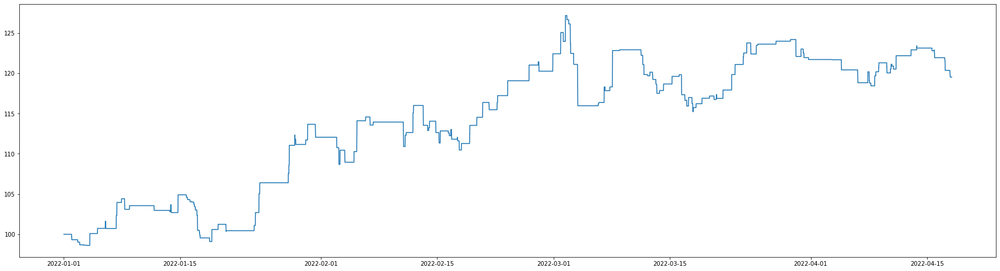

In [18]:
if reinvest_profit_flag == True:
    fig, ax = plt.subplots(figsize=(30, 8))
    ax.plot(budget_dict['time'], budget_dict['budget'])
else:
    print("Not reinvest profit")

In [19]:
if reinvest_profit_flag == True:
    print(f"Max drawdown: {round(max_drawdown * 100, 2)}%")

Max drawdown: 4.68%


In [20]:
win_rate = len(transaction_df[transaction_df['profit'] > 0]) / len(transaction_df)
print(f"Win rate: {round(win_rate * 100, 2)}%")

Win rate: 42.21%


In [21]:
for symbol in transaction_df['symbol'].unique():
    symbol_df = transaction_df[transaction_df['symbol'] == symbol]
    win_rate = len(symbol_df[symbol_df['profit'] > 0]) / len(symbol_df)
    print(f"{symbol} win rate: {round(win_rate * 100, 2)}%")

ETH-PERP win rate: 37.08%
LUNA-PERP win rate: 48.53%
SOL-PERP win rate: 42.53%


In [22]:
print(f"Distribution")
print(pd.DataFrame(transaction_df['profit_percent'].describe()))

Distribution
       profit_percent
count      244.000000
mean        -0.290094
std          2.169285
min         -4.814447
25%         -1.841678
50%         -0.762078
75%          1.303774
max          5.202311


In [23]:
for symbol in transaction_df['symbol'].unique():
    temp_return = transaction_df[transaction_df['symbol'] == symbol]['profit_percent']
    
    print(f"Distribution {symbol}:")
    print(pd.DataFrame(temp_return.describe()))
    print("\n")

Distribution ETH-PERP:
       profit_percent
count       89.000000
mean        -0.365702
std          1.773777
min         -4.327392
25%         -1.576630
50%         -0.878527
75%          0.903351
max          4.853103


Distribution LUNA-PERP:
       profit_percent
count       68.000000
mean        -0.295852
std          2.292723
min         -4.364631
25%         -2.123786
50%         -0.015567
75%          1.668876
max          3.513641


Distribution SOL-PERP:
       profit_percent
count       87.000000
mean        -0.208247
std          2.443193
min         -4.814447
25%         -1.872685
50%         -1.032041
75%          1.539610
max          5.202311


